# Instacart Market Basket Analysis


In [147]:

%matplotlib inline

from wordcloud import *
import textblob
import numpy as np
from nltk import tokenize
from nltk.corpus import stopwords
from collections import Counter
import random
import string
import operator
import re
import pandas as pd
import math
import os
import networkx as nx
from matplotlib import pyplot
import matplotlib.pyplot as plt
import plotly as py
import plotly.graph_objs as go
import psycopg2
import seaborn as sbn
import requests
import textatistic
from IPython.display import display, Markdown
from bs4 import BeautifulSoup
py.offline.init_notebook_mode()
from IPython.display import HTML

In [149]:
HTML('''<script>
code_show=true; 
function code_toggle() {
 if (code_show){
 $('div.input').hide();
 } else {
 $('div.input').show();
 }
 code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
The raw code for this IPython notebook is by default hidden for easier reading.
To toggle on/off the raw code, click <a href="javascript:code_toggle()">here</a>.''')

In [86]:
# aisles = pd.read_csv('/home/faculty/millbr02/pub/ecomm/aisles.csv')
# dept = pd.read_csv('/home/faculty/millbr02/pub/ecomm/departments.csv')
#opp = pd.read_csv('/home/faculty/millbr02/pub/ecomm/order_products__prior.csv')
opt = pd.read_csv('/home/faculty/millbr02/pub/ecomm/order_products__train.csv')
# orders = pd.read_csv('/home/faculty/millbr02/pub/ecomm/orders.csv')
products = pd.read_csv('/home/faculty/millbr02/pub/ecomm/products.csv')

In [87]:
msk = np.random.rand(len(opt)) < 0.8
train = opt[msk]
test = opt[~msk]

In [88]:
aco = train.groupby('order_id')

In [89]:
aco.get_group(36)['product_id']

8     39612
9     19660
10    49235
11    43086
12    46620
13    34497
14    48679
15    46979
Name: product_id, dtype: int64

In [90]:
unique_orderids = aco.groups.keys()

In [91]:
%%time
iimat = {}
for oid in unique_orderids:
    for product1 in aco.get_group(oid)['product_id']:
        if int(product1) not in iimat:
            iimat[int(product1)] = {}
        for product2 in aco.get_group(oid)['product_id']:
            if product1 != product2:
                iimat[int(product1)][int(product2)] = iimat[int(product1)].get(int(product2),0) +1

CPU times: user 8min 4s, sys: 3.85 s, total: 8min 8s
Wall time: 8min 8s


In [92]:
%%time
msofar = 0
ones =0
for key in iimat:
    for i in iimat[key]:
        if iimat[key][i]==1:
            ones += 1
        if iimat[key][i] > msofar:
            msofar = iimat[key][i]
            print(key,i,msofar)

1 30720 1
1 11266 3
1 31759 5
1 6184 9
10 4138 19
34 24852 33
34 13176 36
45 26209 42
45 24852 119
260 24852 214
260 21137 216
432 24852 237
2295 15290 250
4605 47626 468
4605 24852 706
4920 24852 729
13176 39275 742
13176 47209 1507
13176 21137 2004
CPU times: user 3.74 s, sys: 96 ms, total: 3.84 s
Wall time: 3.83 s


In [93]:
delkeys = []
for i in iimat.keys():
    for k,v in iimat[i].items():
        if v == 1:
            delkeys.append((i,k))

In [94]:
for i, j in delkeys:
    del iimat[i][j]

In [95]:
import json
with open('item_item.json', 'w') as f:
    json.dump(iimat,f)

In [96]:
#t = pd.DataFrame(iimat).to_sparse()
t = pd.read_json('/home/faculty/millbr02/pub/item_item.json')
t.head()

,1,10,100,1000,10000,10001,10005,10006,10008,10009,...,9985,9986,9989,999,9990,9993,9995,9996,9997,9998
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10005,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [97]:
def getval(d):
    return d[1]

recs = sorted(t[13176].items(), key=getval, reverse=True)

In [98]:
def predictor(mat, item1, item2):
    recs = list(mat[item1].items()) + list(mat[item2].items())
    recs= sorted(recs, key=getval, reverse = True)
    recs = [recs[x][0] for x in range(min(5, len(recs)))]
    recs = list(set(recs))
    return recs

In [99]:
for p in predictor(t, 13176,21137):
    print(products[products.product_id == p].product_name)
    

19271    Veganic Sprouted Brown Rice Cacao Crisps
Name: product_name, dtype: object
10007    Sheeps Milk Maple Yogurt
Name: product_name, dtype: object
10010    Baby Diapers Size 2
Name: product_name, dtype: object
10004    Potstickers, Organic, Pork & Vegetable
Name: product_name, dtype: object
10016    Tilapia Filet
Name: product_name, dtype: object


In [100]:
#for p in predictor(t,13176,21137):
    #print(products[products.product_id])

In [101]:
test = pd.read_csv('/home/faculty/millbr02/pub/mytest.csv')


In [102]:
tco = test.groupby('order_id')

In [122]:
# import pickle
# pickle.load('/home/faculty/millbr02/pub/item_item.pkl')

# Prediction Precent Correct

In [103]:
hits = 0
count = 0
for order in tco.groups.keys():
    contents = list(tco.get_group(order).sort_values('add_to_cart_order').product_id)
    if len(contents) > 2:
        count += 1
        recs = predictor(iimat, contents[0], contents[1])
        basket = set(contents[3:])
        recs = set(recs)
        correct_recs = recs.intersection(basket)
        if len(correct_recs) >= 1:
            hits += 1
            
            
print(hits, count, hits/count)

KeyError: 15882

# Aisles

In [104]:
#merge products and training set
merge1 = products.merge(opt).sort_values(by='order_id').reset_index(drop=True)

In [105]:
merge2 = merge1.set_index(["order_id"]).reset_index()
#reset index to order_id

In [106]:
grouped = merge2.groupby('order_id')
#group by order_id

In [107]:
grouped.get_group(1).sort_values(by='add_to_cart_order').reset_index(drop=True)

,order_id,product_id,product_name,aisle_id,department_id,add_to_cart_order,reordered
0,1,49302,Bulgarian Yogurt,120,16,1,1
1,1,11109,Organic 4% Milk Fat Whole Milk Cottage Cheese,108,16,2,1
2,1,10246,Organic Celery Hearts,83,4,3,0
3,1,49683,Cucumber Kirby,83,4,4,0
4,1,43633,Lightly Smoked Sardines in Olive Oil,95,15,5,1
5,1,13176,Bag of Organic Bananas,24,4,6,0
6,1,47209,Organic Hass Avocado,24,4,7,0
7,1,22035,Organic Whole String Cheese,21,16,8,1


In [108]:
%%time
aisles_to_aisles = {}
for i in list(set(merge2.order_id)):
    
    # get group by object for each order_id then sort by order added to cart
    grouped2 = grouped.get_group(i).sort_values(by='add_to_cart_order').reset_index(drop=True)
    
    aisles_list = list(grouped2.aisle_id)
    
    #create the aisle to aisle matrix
    for item in list(zip(aisles_list,aisles_list[1:])):
        if item[0] not in aisles_to_aisles:
            aisles_to_aisles[item[0]] = {item[1]:1}
        else:
            if item[1] not in aisles_to_aisles[item[0]]:
                aisles_to_aisles[item[0]][item[1]] = 1
            else:
                aisles_to_aisles[item[0]][item[1]] += 1

CPU times: user 2min 21s, sys: 4.05 s, total: 2min 25s
Wall time: 2min 25s


In [109]:
#replace nans with 0's
nonans = pd.DataFrame(aisles_to_aisles).fillna(0)

In [110]:
nonans.head()

,1,2,3,4,5,6,7,8,9,10,...,125,126,127,128,129,130,131,132,133,134
1,188.0,5.0,34.0,21.0,6.0,6.0,4.0,7.0,16.0,0.0,...,2.0,2.0,1.0,16.0,19.0,15.0,12.0,0.0,1.0,0.0
2,12.0,134.0,23.0,21.0,6.0,2.0,9.0,3.0,44.0,2.0,...,2.0,0.0,2.0,28.0,24.0,8.0,55.0,1.0,2.0,2.0
3,23.0,19.0,4483.0,85.0,13.0,17.0,8.0,13.0,75.0,0.0,...,44.0,11.0,11.0,41.0,67.0,76.0,59.0,1.0,5.0,0.0
4,18.0,28.0,78.0,1164.0,41.0,11.0,17.0,10.0,116.0,3.0,...,10.0,7.0,13.0,52.0,110.0,45.0,132.0,1.0,9.0,1.0
5,6.0,12.0,21.0,42.0,91.0,5.0,6.0,2.0,41.0,2.0,...,0.0,0.0,2.0,24.0,31.0,10.0,25.0,0.0,2.0,0.0


In [111]:
nonans[24]

1        253
2        310
3       1235
4        536
5        125
6        143
7        102
8        131
9        519
10        26
11        47
12       114
13       372
14       397
15        99
16      1899
17       699
18        89
19       739
20       124
21      3448
22        49
23       553
24     29836
25       167
26       579
27        41
28        38
29       178
30       206
       ...  
105      250
106      949
107     2225
108      942
109       29
110      299
111       74
112     2391
113       16
114      163
115     2897
116     2491
117     1198
118       16
119       66
120     5350
121     1173
122      261
123    12371
124       17
125      101
126       42
127       75
128      680
129      538
130      508
131      719
132       10
133       39
134        9
Name: 24, Length: 134, dtype: int64

# Heatmap of Aisle to Aisle matrix

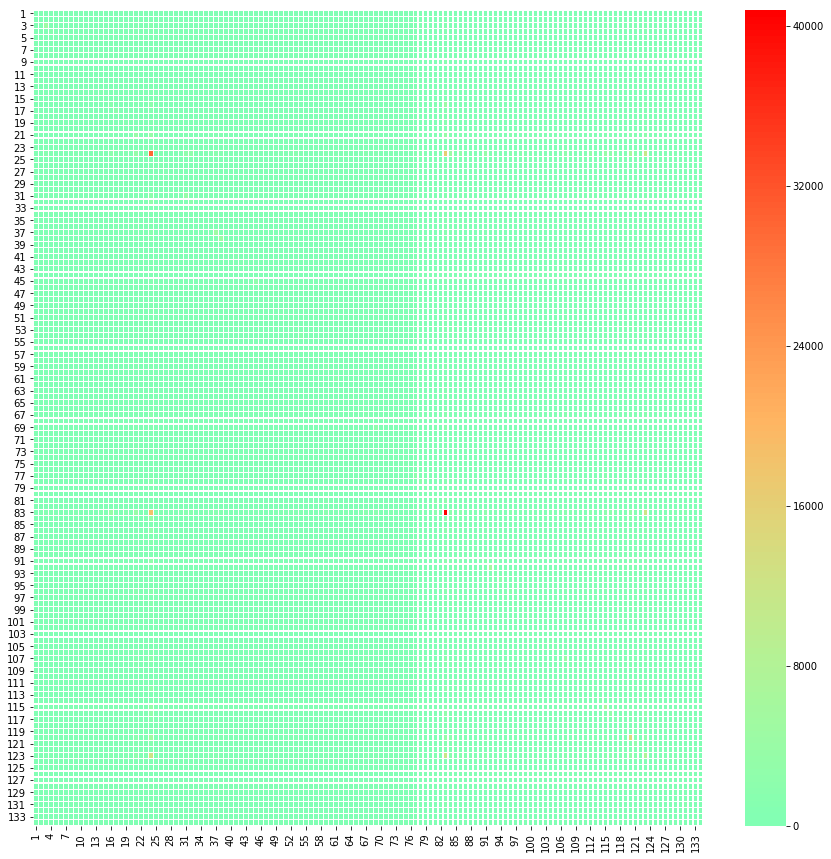

In [112]:

size = (15, 15)
fig, ax = pyplot.subplots(figsize=size)
ax = sbn.heatmap(nonans, vmin=0, linewidths=.2, center=0,cmap="rainbow")

In [135]:
nonan_copy = nonans.copy()
nonan_copy['average'] = nonans.mean(numeric_only=True, axis=1)
nonan_copy.average.describe()

count     134.000000
mean       69.804411
std       138.498447
min         1.932836
25%         9.332090
50%        31.298507
75%        82.332090
max      1056.171642
Name: average, dtype: float64

In [146]:
df2 = nonan_copy[nonan_copy.average > 70]
df3 = df2.drop('average',1)
list2 = df3.values.tolist()
list2

[[23.0,
  19.0,
  4483.0,
  85.0,
  13.0,
  17.0,
  8.0,
  13.0,
  75.0,
  0.0,
  11.0,
  10.0,
  45.0,
  43.0,
  4.0,
  46.0,
  66.0,
  13.0,
  54.0,
  21.0,
  327.0,
  7.0,
  153.0,
  1235.0,
  22.0,
  99.0,
  8.0,
  10.0,
  22.0,
  21.0,
  304.0,
  56.0,
  6.0,
  19.0,
  39.0,
  59.0,
  181.0,
  169.0,
  5.0,
  10.0,
  15.0,
  45.0,
  37.0,
  4.0,
  210.0,
  18.0,
  27.0,
  164.0,
  34.0,
  184.0,
  46.0,
  109.0,
  100.0,
  87.0,
  3.0,
  6.0,
  123.0,
  13.0,
  59.0,
  13.0,
  180.0,
  4.0,
  32.0,
  64.0,
  75.0,
  48.0,
  124.0,
  3.0,
  78.0,
  7.0,
  16.0,
  42.0,
  8.0,
  30.0,
  19.0,
  5.0,
  133.0,
  372.0,
  79.0,
  1.0,
  26.0,
  1.0,
  688.0,
  248.0,
  20.0,
  148.0,
  4.0,
  155.0,
  22.0,
  8.0,
  279.0,
  81.0,
  105.0,
  115.0,
  18.0,
  153.0,
  4.0,
  115.0,
  56.0,
  169.0,
  4.0,
  1.0,
  2.0,
  35.0,
  44.0,
  90.0,
  470.0,
  82.0,
  2.0,
  35.0,
  12.0,
  186.0,
  1.0,
  23.0,
  378.0,
  159.0,
  188.0,
  1.0,
  7.0,
  597.0,
  253.0,
  12.0,
  578.0,
  3.0,

In [142]:
# list1 = nonans.values.tolist()
# list1

# Network Graph of the Aisles to Aisles matrix


(134, 134)

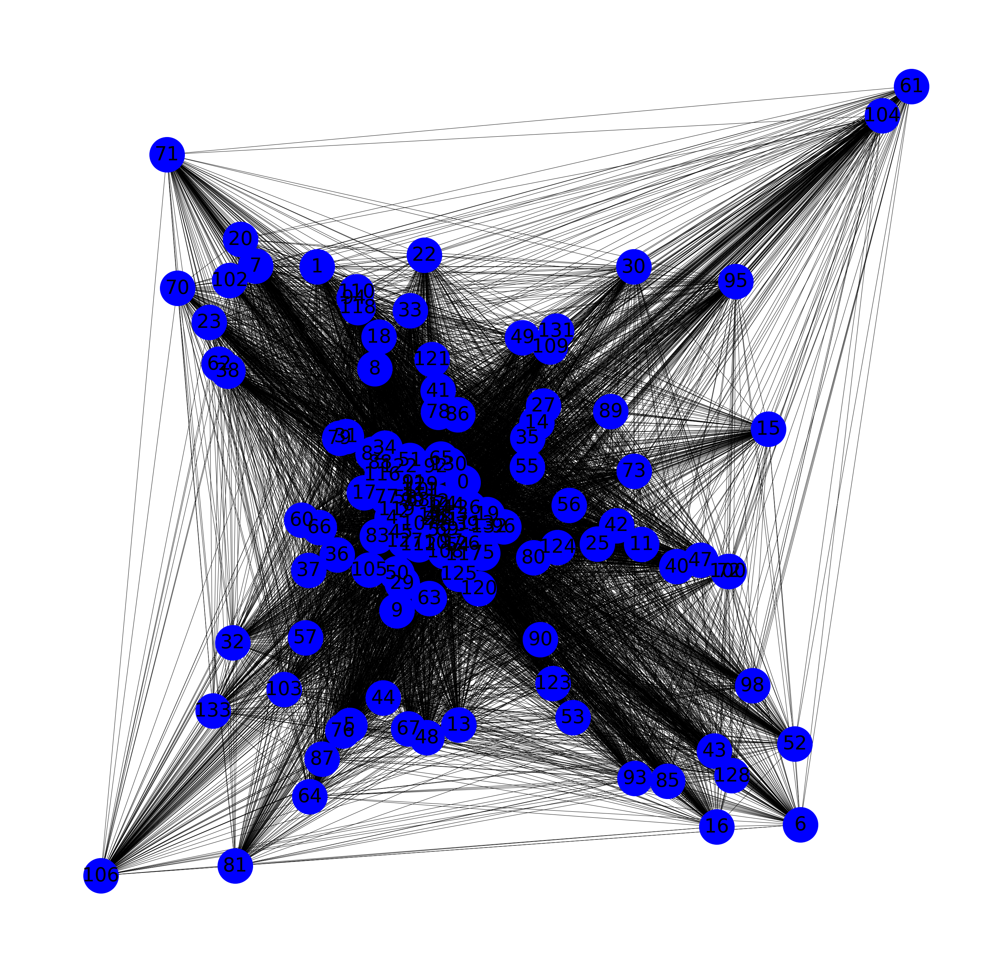

In [113]:
#network graph of the aisles
import numpy
A=numpy.matrix(nonans)
G=nx.from_numpy_matrix(A)
G.edges(data=True)
Gfig, gax = plt.subplots(figsize = (50,50))
nx.draw(G,nx.spring_layout(G, iterations=5), ax=gax, with_labels=True, node_color="Blue", node_size=10000, font_size = 55)
A.shape

In [114]:
%load_ext py_d3

In [145]:
%%d3 4.11.0

<style>

.group-tick line {
  stroke: #000;
}

.ribbons {
  fill-opacity: 0.67;
}
</style>

<svg width=960 height=960></svg>

<script>
var matrix = [[23.0,
  19.0,
  4483.0,
  85.0,
  13.0,
  17.0,
  8.0,
  13.0,
  75.0,
  0.0,
  11.0,
  10.0,
  45.0,
  43.0,
  4.0,
  46.0,
  66.0,
  13.0,
  54.0,
  21.0,
  327.0,
  7.0,
  153.0,
  1235.0,
  22.0,
  99.0,
  8.0,
  10.0,
  22.0,
  21.0,
  304.0,
  56.0,
  6.0,
  19.0,
  39.0,
  59.0,
  181.0,
  169.0,
  5.0,
  10.0,
  15.0,
  45.0,
  37.0,
  4.0,
  210.0,
  18.0,
  27.0,
  164.0,
  34.0,
  184.0,
  46.0,
  109.0,
  100.0,
  87.0,
  3.0,
  6.0,
  123.0,
  13.0,
  59.0,
  13.0,
  180.0,
  4.0,
  32.0,
  64.0,
  75.0,
  48.0,
  124.0,
  3.0,
  78.0,
  7.0,
  16.0,
  42.0,
  8.0,
  30.0,
  19.0,
  5.0,
  133.0,
  372.0,
  79.0,
  1.0,
  26.0,
  1.0,
  688.0,
  248.0,
  20.0,
  148.0,
  4.0,
  155.0,
  22.0,
  8.0,
  279.0,
  81.0,
  105.0,
  115.0,
  18.0,
  153.0,
  4.0,
  115.0,
  56.0,
  169.0,
  4.0,
  1.0,
  2.0,
  35.0,
  44.0,
  90.0,
  470.0,
  82.0,
  2.0,
  35.0,
  12.0,
  186.0,
  1.0,
  23.0,
  378.0,
  159.0,
  188.0,
  1.0,
  7.0,
  597.0,
  253.0,
  12.0,
  578.0,
  3.0,
  44.0,
  11.0,
  11.0,
  41.0,
  67.0,
  76.0,
  59.0,
  1.0,
  5.0,
  0.0,
  121.72388059701493],
 [18.0,
  28.0,
  78.0,
  1164.0,
  41.0,
  11.0,
  17.0,
  10.0,
  116.0,
  3.0,
  6.0,
  17.0,
  39.0,
  27.0,
  7.0,
  49.0,
  49.0,
  0.0,
  47.0,
  24.0,
  322.0,
  6.0,
  52.0,
  536.0,
  12.0,
  52.0,
  9.0,
  5.0,
  13.0,
  35.0,
  134.0,
  34.0,
  4.0,
  41.0,
  36.0,
  55.0,
  133.0,
  170.0,
  9.0,
  16.0,
  13.0,
  50.0,
  44.0,
  4.0,
  46.0,
  2.0,
  8.0,
  28.0,
  64.0,
  65.0,
  41.0,
  94.0,
  52.0,
  85.0,
  1.0,
  9.0,
  20.0,
  4.0,
  185.0,
  10.0,
  80.0,
  5.0,
  136.0,
  30.0,
  12.0,
  73.0,
  63.0,
  1.0,
  157.0,
  4.0,
  7.0,
  64.0,
  4.0,
  26.0,
  17.0,
  19.0,
  116.0,
  174.0,
  97.0,
  5.0,
  101.0,
  1.0,
  589.0,
  173.0,
  13.0,
  90.0,
  5.0,
  88.0,
  40.0,
  7.0,
  114.0,
  49.0,
  67.0,
  32.0,
  38.0,
  137.0,
  6.0,
  98.0,
  54.0,
  51.0,
  9.0,
  2.0,
  2.0,
  36.0,
  72.0,
  121.0,
  223.0,
  87.0,
  1.0,
  29.0,
  20.0,
  162.0,
  2.0,
  29.0,
  161.0,
  131.0,
  63.0,
  3.0,
  6.0,
  252.0,
  138.0,
  21.0,
  347.0,
  3.0,
  10.0,
  7.0,
  13.0,
  52.0,
  110.0,
  45.0,
  132.0,
  1.0,
  9.0,
  1.0,
  70.09701492537313],
 [13.0,
  72.0,
  39.0,
  37.0,
  46.0,
  7.0,
  16.0,
  4.0,
  81.0,
  3.0,
  4.0,
  19.0,
  17.0,
  55.0,
  9.0,
  1360.0,
  107.0,
  9.0,
  131.0,
  10.0,
  451.0,
  4.0,
  19.0,
  1899.0,
  22.0,
  33.0,
  6.0,
  1.0,
  21.0,
  65.0,
  103.0,
  43.0,
  7.0,
  23.0,
  74.0,
  110.0,
  81.0,
  40.0,
  23.0,
  4.0,
  8.0,
  12.0,
  31.0,
  1.0,
  27.0,
  1.0,
  4.0,
  2.0,
  56.0,
  34.0,
  42.0,
  23.0,
  106.0,
  44.0,
  1.0,
  0.0,
  22.0,
  14.0,
  184.0,
  5.0,
  24.0,
  6.0,
  88.0,
  4.0,
  8.0,
  125.0,
  98.0,
  11.0,
  214.0,
  4.0,
  2.0,
  110.0,
  0.0,
  13.0,
  14.0,
  2.0,
  56.0,
  62.0,
  22.0,
  1.0,
  326.0,
  2.0,
  4239.0,
  172.0,
  12.0,
  157.0,
  3.0,
  50.0,
  17.0,
  1.0,
  164.0,
  21.0,
  34.0,
  40.0,
  34.0,
  94.0,
  5.0,
  94.0,
  8.0,
  72.0,
  2.0,
  2.0,
  4.0,
  298.0,
  17.0,
  74.0,
  103.0,
  143.0,
  3.0,
  61.0,
  3.0,
  130.0,
  0.0,
  13.0,
  126.0,
  203.0,
  104.0,
  2.0,
  8.0,
  241.0,
  50.0,
  43.0,
  1078.0,
  1.0,
  2.0,
  3.0,
  3.0,
  101.0,
  40.0,
  34.0,
  149.0,
  0.0,
  4.0,
  2.0,
  112.99253731343283],
 [8.0,
  25.0,
  68.0,
  58.0,
  39.0,
  24.0,
  12.0,
  16.0,
  69.0,
  11.0,
  8.0,
  9.0,
  11.0,
  37.0,
  9.0,
  129.0,
  1755.0,
  9.0,
  285.0,
  32.0,
  269.0,
  10.0,
  43.0,
  699.0,
  21.0,
  87.0,
  8.0,
  2.0,
  81.0,
  16.0,
  123.0,
  54.0,
  15.0,
  18.0,
  43.0,
  328.0,
  141.0,
  76.0,
  2.0,
  10.0,
  16.0,
  26.0,
  30.0,
  7.0,
  109.0,
  7.0,
  26.0,
  20.0,
  30.0,
  27.0,
  32.0,
  41.0,
  197.0,
  104.0,
  5.0,
  13.0,
  19.0,
  17.0,
  73.0,
  13.0,
  77.0,
  3.0,
  76.0,
  21.0,
  17.0,
  96.0,
  66.0,
  13.0,
  113.0,
  8.0,
  15.0,
  126.0,
  7.0,
  42.0,
  50.0,
  8.0,
  96.0,
  140.0,
  30.0,
  7.0,
  115.0,
  2.0,
  861.0,
  277.0,
  38.0,
  217.0,
  10.0,
  182.0,
  53.0,
  29.0,
  261.0,
  31.0,
  58.0,
  82.0,
  35.0,
  84.0,
  51.0,
  78.0,
  46.0,
  65.0,
  7.0,
  4.0,
  7.0,
  222.0,
  142.0,
  72.0,
  163.0,
  172.0,
  6.0,
  29.0,
  10.0,
  108.0,
  4.0,
  47.0,
  176.0,
  190.0,
  224.0,
  4.0,
  17.0,
  226.0,
  163.0,
  27.0,
  429.0,
  3.0,
  1.0,
  9.0,
  14.0,
  50.0,
  59.0,
  148.0,
  84.0,
  2.0,
  19.0,
  2.0,
  88.7910447761194],
 [15.0,
  29.0,
  49.0,
  62.0,
  37.0,
  13.0,
  13.0,
  7.0,
  53.0,
  8.0,
  3.0,
  8.0,
  17.0,
  31.0,
  9.0,
  183.0,
  285.0,
  5.0,
  676.0,
  27.0,
  258.0,
  10.0,
  31.0,
  739.0,
  26.0,
  51.0,
  4.0,
  3.0,
  64.0,
  31.0,
  108.0,
  121.0,
  6.0,
  27.0,
  31.0,
  156.0,
  91.0,
  49.0,
  12.0,
  10.0,
  14.0,
  15.0,
  24.0,
  5.0,
  70.0,
  4.0,
  12.0,
  4.0,
  31.0,
  27.0,
  31.0,
  31.0,
  82.0,
  91.0,
  2.0,
  4.0,
  15.0,
  9.0,
  90.0,
  21.0,
  44.0,
  5.0,
  87.0,
  13.0,
  9.0,
  152.0,
  64.0,
  3.0,
  103.0,
  12.0,
  11.0,
  167.0,
  2.0,
  50.0,
  61.0,
  10.0,
  48.0,
  85.0,
  19.0,
  1.0,
  155.0,
  1.0,
  1147.0,
  139.0,
  44.0,
  121.0,
  6.0,
  133.0,
  32.0,
  6.0,
  178.0,
  28.0,
  34.0,
  78.0,
  39.0,
  71.0,
  22.0,
  93.0,
  17.0,
  38.0,
  7.0,
  1.0,
  3.0,
  201.0,
  39.0,
  73.0,
  137.0,
  66.0,
  10.0,
  73.0,
  5.0,
  118.0,
  4.0,
  47.0,
  176.0,
  158.0,
  119.0,
  5.0,
  8.0,
  200.0,
  89.0,
  20.0,
  514.0,
  8.0,
  5.0,
  5.0,
  10.0,
  36.0,
  36.0,
  55.0,
  73.0,
  1.0,
  9.0,
  0.0,
  71.48507462686567],
 [78.0,
  262.0,
  296.0,
  298.0,
  99.0,
  28.0,
  49.0,
  18.0,
  594.0,
  11.0,
  20.0,
  62.0,
  115.0,
  134.0,
  21.0,
  413.0,
  249.0,
  11.0,
  238.0,
  41.0,
  3620.0,
  15.0,
  152.0,
  3448.0,
  52.0,
  154.0,
  21.0,
  16.0,
  50.0,
  167.0,
  410.0,
  285.0,
  19.0,
  98.0,
  149.0,
  359.0,
  425.0,
  334.0,
  19.0,
  34.0,
  36.0,
  131.0,
  214.0,
  7.0,
  206.0,
  11.0,
  24.0,
  73.0,
  185.0,
  160.0,
  190.0,
  276.0,
  427.0,
  235.0,
  6.0,
  23.0,
  88.0,
  68.0,
  389.0,
  18.0,
  211.0,
  25.0,
  124.0,
  82.0,
  30.0,
  126.0,
  448.0,
  12.0,
  339.0,
  10.0,
  50.0,
  250.0,
  17.0,
  72.0,
  71.0,
  15.0,
  278.0,
  712.0,
  197.0,
  15.0,
  420.0,
  7.0,
  3717.0,
  938.0,
  41.0,
  732.0,
  11.0,
  280.0,
  164.0,
  21.0,
  588.0,
  212.0,
  309.0,
  150.0,
  91.0,
  1237.0,
  21.0,
  303.0,
  125.0,
  171.0,
  16.0,
  8.0,
  7.0,
  203.0,
  139.0,
  440.0,
  825.0,
  816.0,
  5.0,
  175.0,
  20.0,
  932.0,
  6.0,
  78.0,
  641.0,
  486.0,
  313.0,
  9.0,
  18.0,
  1474.0,
  373.0,
  112.0,
  2199.0,
  12.0,
  39.0,
  13.0,
  25.0,
  579.0,
  238.0,
  178.0,
  524.0,
  2.0,
  10.0,
  9.0,
  292.36567164179104],
 [213.0,
  275.0,
  1125.0,
  505.0,
  138.0,
  97.0,
  108.0,
  109.0,
  531.0,
  23.0,
  46.0,
  83.0,
  313.0,
  367.0,
  70.0,
  1798.0,
  745.0,
  95.0,
  729.0,
  139.0,
  3058.0,
  35.0,
  503.0,
  29836.0,
  121.0,
  570.0,
  40.0,
  41.0,
  198.0,
  208.0,
  1992.0,
  2428.0,
  45.0,
  211.0,
  443.0,
  737.0,
  1287.0,
  841.0,
  145.0,
  64.0,
  99.0,
  254.0,
  309.0,
  20.0,
  569.0,
  37.0,
  137.0,
  153.0,
  424.0,
  510.0,
  288.0,
  719.0,
  1118.0,
  622.0,
  20.0,
  63.0,
  315.0,
  95.0,
  738.0,
  59.0,
  511.0,
  31.0,
  392.0,
  227.0,
  102.0,
  420.0,
  1169.0,
  59.0,
  782.0,
  76.0,
  105.0,
  539.0,
  21.0,
  190.0,
  169.0,
  32.0,
  805.0,
  1257.0,
  404.0,
  18.0,
  645.0,
  24.0,
  16344.0,
  4412.0,
  130.0,
  2372.0,
  49.0,
  910.0,
  243.0,
  41.0,
  3045.0,
  713.0,
  773.0,
  605.0,
  215.0,
  1267.0,
  45.0,
  1161.0,
  274.0,
  600.0,
  22.0,
  24.0,
  25.0,
  478.0,
  229.0,
  846.0,
  1900.0,
  928.0,
  33.0,
  286.0,
  84.0,
  2304.0,
  25.0,
  184.0,
  3256.0,
  2114.0,
  982.0,
  22.0,
  52.0,
  5329.0,
  1123.0,
  252.0,
  11124.0,
  44.0,
  85.0,
  48.0,
  62.0,
  631.0,
  516.0,
  492.0,
  581.0,
  11.0,
  40.0,
  5.0,
  986.3805970149253],
 [48.0,
  43.0,
  226.0,
  118.0,
  30.0,
  21.0,
  14.0,
  26.0,
  75.0,
  4.0,
  22.0,
  22.0,
  64.0,
  58.0,
  13.0,
  107.0,
  100.0,
  8.0,
  103.0,
  35.0,
  416.0,
  16.0,
  78.0,
  2124.0,
  36.0,
  165.0,
  14.0,
  10.0,
  36.0,
  23.0,
  3300.0,
  96.0,
  4.0,
  33.0,
  35.0,
  114.0,
  309.0,
  211.0,
  8.0,
  20.0,
  24.0,
  64.0,
  55.0,
  5.0,
  154.0,
  6.0,
  39.0,
  41.0,
  56.0,
  83.0,
  46.0,
  139.0,
  149.0,
  131.0,
  4.0,
  10.0,
  51.0,
  17.0,
  75.0,
  14.0,
  118.0,
  10.0,
  59.0,
  123.0,
  33.0,
  66.0,
  168.0,
  4.0,
  141.0,
  21.0,
  27.0,
  95.0,
  7.0,
  42.0,
  43.0,
  11.0,
  335.0,
  245.0,
  85.0,
  7.0,
  85.0,
  6.0,
  1094.0,
  690.0,
  26.0,
  336.0,
  10.0,
  103.0,
  47.0,
  14.0,
  526.0,
  91.0,
  139.0,
  240.0,
  23.0,
  205.0,
  7.0,
  681.0,
  55.0,
  148.0,
  6.0,
  2.0,
  6.0,
  69.0,
  52.0,
  161.0,
  417.0,
  139.0,
  8.0,
  43.0,
  14.0,
  355.0,
  7.0,
  39.0,
  682.0,
  233.0,
  146.0,
  8.0,
  17.0,
  767.0,
  213.0,
  25.0,
  826.0,
  28.0,
  13.0,
  16.0,
  26.0,
  82.0,
  130.0,
  77.0,
  90.0,
  3.0,
  11.0,
  19.0,
  151.07462686567163],
 [26.0,
  22.0,
  56.0,
  26.0,
  8.0,
  8.0,
  23.0,
  24.0,
  34.0,
  2.0,
  6.0,
  6.0,
  18.0,
  18.0,
  7.0,
  54.0,
  50.0,
  15.0,
  99.0,
  5.0,
  270.0,
  2.0,
  50.0,
  2415.0,
  4.0,
  47.0,
  1.0,
  6.0,
  7.0,
  15.0,
  102.0,
  1630.0,
  4.0,
  80.0,
  25.0,
  95.0,
  77.0,
  65.0,
  6.0,
  6.0,
  2.0,
  16.0,
  44.0,
  2.0,
  60.0,
  9.0,
  5.0,
  16.0,
  33.0,
  61.0,
  22.0,
  25.0,
  83.0,
  36.0,
  3.0,
  2.0,
  8.0,
  3.0,
  54.0,
  9.0,
  54.0,
  4.0,
  17.0,
  9.0,
  3.0,
  14.0,
  106.0,
  5.0,
  53.0,
  2.0,
  5.0,
  30.0,
  9.0,
  6.0,
  40.0,
  1.0,
  111.0,
  96.0,
  14.0,
  3.0,
  63.0,
  0.0,
  900.0,
  302.0,
  25.0,
  90.0,
  3.0,
  75.0,
  20.0,
  4.0,
  138.0,
  27.0,
  51.0,
  20.0,
  22.0,
  82.0,
  5.0,
  91.0,
  17.0,
  34.0,
  1.0,
  0.0,
  1.0,
  31.0,
  18.0,
  85.0,
  150.0,
  44.0,
  0.0,
  21.0,
  9.0,
  148.0,
  4.0,
  17.0,
  310.0,
  238.0,
  117.0,
  2.0,
  2.0,
  245.0,
  99.0,
  7.0,
  980.0,
  5.0,
  19.0,
  1.0,
  9.0,
  26.0,
  30.0,
  26.0,
  22.0,
  1.0,
  6.0,
  2.0,
  83.08955223880596],
 [11.0,
  36.0,
  56.0,
  77.0,
  24.0,
  10.0,
  8.0,
  10.0,
  50.0,
  4.0,
  6.0,
  10.0,
  24.0,
  26.0,
  5.0,
  104.0,
  333.0,
  5.0,
  154.0,
  16.0,
  357.0,
  4.0,
  47.0,
  749.0,
  13.0,
  61.0,
  7.0,
  5.0,
  45.0,
  22.0,
  138.0,
  93.0,
  4.0,
  16.0,
  29.0,
  406.0,
  129.0,
  84.0,
  7.0,
  6.0,
  12.0,
  12.0,
  33.0,
  0.0,
  57.0,
  3.0,
  15.0,
  14.0,
  40.0,
  30.0,
  25.0,
  77.0,
  200.0,
  83.0,
  0.0,
  6.0,
  14.0,
  10.0,
  72.0,
  13.0,
  58.0,
  1.0,
  46.0,
  13.0,
  9.0,
  33.0,
  62.0,
  6.0,
  102.0,
  5.0,
  10.0,
  72.0,
  2.0,
  35.0,
  18.0,
  5.0,
  80.0,
  112.0,
  29.0,
  5.0,
  86.0,
  3.0,
  935.0,
  360.0,
  14.0,
  340.0,
  2.0,
  109.0,
  32.0,
  11.0,
  173.0,
  46.0,
  97.0,
  44.0,
  14.0,
  110.0,
  14.0,
  89.0,
  28.0,
  41.0,
  8.0,
  3.0,
  3.0,
  107.0,
  48.0,
  108.0,
  152.0,
  191.0,
  2.0,
  32.0,
  5.0,
  251.0,
  3.0,
  28.0,
  161.0,
  127.0,
  73.0,
  2.0,
  11.0,
  316.0,
  102.0,
  19.0,
  388.0,
  5.0,
  7.0,
  7.0,
  4.0,
  54.0,
  56.0,
  68.0,
  88.0,
  2.0,
  8.0,
  3.0,
  71.64179104477611],
 [53.0,
  35.0,
  190.0,
  140.0,
  28.0,
  31.0,
  11.0,
  47.0,
  112.0,
  3.0,
  25.0,
  29.0,
  58.0,
  40.0,
  16.0,
  104.0,
  164.0,
  7.0,
  101.0,
  41.0,
  465.0,
  24.0,
  111.0,
  1304.0,
  36.0,
  103.0,
  15.0,
  18.0,
  37.0,
  32.0,
  331.0,
  85.0,
  9.0,
  39.0,
  39.0,
  144.0,
  4648.0,
  312.0,
  11.0,
  26.0,
  35.0,
  87.0,
  67.0,
  11.0,
  220.0,
  11.0,
  22.0,
  54.0,
  64.0,
  107.0,
  46.0,
  209.0,
  193.0,
  181.0,
  6.0,
  10.0,
  47.0,
  27.0,
  90.0,
  21.0,
  244.0,
  12.0,
  58.0,
  63.0,
  27.0,
  80.0,
  170.0,
  3.0,
  163.0,
  19.0,
  48.0,
  97.0,
  9.0,
  38.0,
  49.0,
  10.0,
  302.0,
  248.0,
  199.0,
  9.0,
  78.0,
  2.0,
  1068.0,
  371.0,
  32.0,
  190.0,
  10.0,
  148.0,
  55.0,
  20.0,
  484.0,
  82.0,
  109.0,
  105.0,
  24.0,
  200.0,
  16.0,
  195.0,
  50.0,
  305.0,
  12.0,
  5.0,
  49.0,
  74.0,
  102.0,
  171.0,
  529.0,
  186.0,
  5.0,
  56.0,
  26.0,
  273.0,
  2.0,
  59.0,
  440.0,
  243.0,
  133.0,
  8.0,
  52.0,
  677.0,
  250.0,
  29.0,
  680.0,
  13.0,
  9.0,
  12.0,
  34.0,
  79.0,
  153.0,
  65.0,
  122.0,
  5.0,
  15.0,
  4.0,
  152.955223880597],
 [42.0,
  27.0,
  161.0,
  159.0,
  24.0,
  20.0,
  14.0,
  18.0,
  106.0,
  4.0,
  14.0,
  31.0,
  85.0,
  55.0,
  7.0,
  51.0,
  66.0,
  3.0,
  42.0,
  20.0,
  424.0,
  9.0,
  75.0,
  1016.0,
  17.0,
  68.0,
  13.0,
  6.0,
  12.0,
  27.0,
  212.0,
  74.0,
  3.0,
  68.0,
  26.0,
  86.0,
  299.0,
  4770.0,
  4.0,
  16.0,
  35.0,
  179.0,
  42.0,
  3.0,
  123.0,
  3.0,
  12.0,
  47.0,
  43.0,
  78.0,
  54.0,
  324.0,
  84.0,
  136.0,
  3.0,
  14.0,
  36.0,
  24.0,
  119.0,
  9.0,
  130.0,
  9.0,
  41.0,
  47.0,
  20.0,
  64.0,
  127.0,
  1.0,
  159.0,
  10.0,
  25.0,
  59.0,
  4.0,
  23.0,
  38.0,
  17.0,
  186.0,
  213.0,
  338.0,
  14.0,
  56.0,
  2.0,
  696.0,
  282.0,
  11.0,
  157.0,
  9.0,
  118.0,
  51.0,
  10.0,
  204.0,
  87.0,
  115.0,
  78.0,
  28.0,
  162.0,
  5.0,
  129.0,
  54.0,
  97.0,
  11.0,
  2.0,
  5.0,
  39.0,
  35.0,
  145.0,
  327.0,
  115.0,
  6.0,
  26.0,
  6.0,
  230.0,
  6.0,
  32.0,
  324.0,
  306.0,
  74.0,
  2.0,
  17.0,
  472.0,
  180.0,
  20.0,
  553.0,
  8.0,
  9.0,
  9.0,
  15.0,
  65.0,
  341.0,
  61.0,
  95.0,
  0.0,
  9.0,
  2.0,
  126.6044776119403],
 [27.0,
  19.0,
  194.0,
  44.0,
  10.0,
  14.0,
  7.0,
  13.0,
  38.0,
  3.0,
  13.0,
  9.0,
  26.0,
  25.0,
  5.0,
  31.0,
  129.0,
  13.0,
  65.0,
  22.0,
  218.0,
  7.0,
  127.0,
  754.0,
  17.0,
  64.0,
  16.0,
  3.0,
  25.0,
  14.0,
  173.0,
  86.0,
  2.0,
  13.0,
  22.0,
  75.0,
  194.0,
  105.0,
  2.0,
  16.0,
  19.0,
  31.0,
  24.0,
  2.0,
  1939.0,
  35.0,
  9.0,
  37.0,
  23.0,
  89.0,
  33.0,
  47.0,
  82.0,
  95.0,
  3.0,
  15.0,
  45.0,
  11.0,
  45.0,
  7.0,
  174.0,
  6.0,
  23.0,
  42.0,
  11.0,
  33.0,
  112.0,
  3.0,
  59.0,
  4.0,
  21.0,
  49.0,
  8.0,
  15.0,
  25.0,
  3.0,
  211.0,
  219.0,
  56.0,
  6.0,
  38.0,
  1.0,
  476.0,
  194.0,
  25.0,
  100.0,
  4.0,
  127.0,
  33.0,
  7.0,
  168.0,
  40.0,
  52.0,
  99.0,
  16.0,
  80.0,
  12.0,
  86.0,
  14.0,
  48.0,
  19.0,
  3.0,
  4.0,
  42.0,
  34.0,
  69.0,
  419.0,
  70.0,
  5.0,
  32.0,
  15.0,
  134.0,
  3.0,
  34.0,
  302.0,
  91.0,
  233.0,
  3.0,
  13.0,
  289.0,
  125.0,
  7.0,
  313.0,
  5.0,
  44.0,
  10.0,
  15.0,
  43.0,
  43.0,
  41.0,
  31.0,
  3.0,
  9.0,
  4.0,
  77.8955223880597],
 [16.0,
  38.0,
  107.0,
  48.0,
  19.0,
  18.0,
  10.0,
  22.0,
  41.0,
  2.0,
  10.0,
  10.0,
  20.0,
  22.0,
  4.0,
  94.0,
  195.0,
  5.0,
  60.0,
  17.0,
  362.0,
  6.0,
  44.0,
  1089.0,
  11.0,
  238.0,
  5.0,
  9.0,
  38.0,
  18.0,
  169.0,
  62.0,
  3.0,
  10.0,
  32.0,
  181.0,
  163.0,
  74.0,
  2.0,
  10.0,
  23.0,
  15.0,
  25.0,
  4.0,
  77.0,
  6.0,
  16.0,
  27.0,
  37.0,
  34.0,
  30.0,
  60.0,
  432.0,
  96.0,
  3.0,
  7.0,
  20.0,
  5.0,
  48.0,
  16.0,
  55.0,
  4.0,
  30.0,
  25.0,
  9.0,
  29.0,
  60.0,
  1.0,
  101.0,
  11.0,
  21.0,
  53.0,
  1.0,
  29.0,
  11.0,
  3.0,
  150.0,
  82.0,
  33.0,
  2.0,
  76.0,
  0.0,
  828.0,
  811.0,
  13.0,
  280.0,
  4.0,
  75.0,
  21.0,
  15.0,
  417.0,
  40.0,
  101.0,
  83.0,
  18.0,
  114.0,
  7.0,
  100.0,
  34.0,
  59.0,
  5.0,
  3.0,
  13.0,
  62.0,
  43.0,
  104.0,
  186.0,
  153.0,
  3.0,
  27.0,
  16.0,
  184.0,
  1.0,
  34.0,
  306.0,
  111.0,
  65.0,
  4.0,
  15.0,
  443.0,
  103.0,
  17.0,
  477.0,
  3.0,
  13.0,
  5.0,
  14.0,
  46.0,
  54.0,
  53.0,
  86.0,
  2.0,
  4.0,
  2.0,
  80.05970149253731],
 [21.0,
  19.0,
  102.0,
  80.0,
  23.0,
  29.0,
  10.0,
  19.0,
  61.0,
  8.0,
  50.0,
  9.0,
  25.0,
  28.0,
  9.0,
  60.0,
  91.0,
  1.0,
  91.0,
  101.0,
  266.0,
  31.0,
  62.0,
  623.0,
  38.0,
  106.0,
  25.0,
  8.0,
  28.0,
  12.0,
  173.0,
  34.0,
  3.0,
  25.0,
  26.0,
  84.0,
  179.0,
  124.0,
  4.0,
  35.0,
  84.0,
  28.0,
  34.0,
  27.0,
  102.0,
  10.0,
  14.0,
  41.0,
  27.0,
  41.0,
  25.0,
  58.0,
  99.0,
  1304.0,
  18.0,
  35.0,
  27.0,
  10.0,
  61.0,
  97.0,
  77.0,
  17.0,
  33.0,
  67.0,
  10.0,
  50.0,
  86.0,
  5.0,
  93.0,
  18.0,
  12.0,
  74.0,
  27.0,
  185.0,
  211.0,
  0.0,
  223.0,
  130.0,
  69.0,
  27.0,
  54.0,
  17.0,
  541.0,
  202.0,
  103.0,
  151.0,
  27.0,
  110.0,
  45.0,
  15.0,
  155.0,
  54.0,
  81.0,
  91.0,
  28.0,
  87.0,
  22.0,
  123.0,
  30.0,
  48.0,
  21.0,
  6.0,
  2.0,
  61.0,
  22.0,
  103.0,
  216.0,
  78.0,
  3.0,
  37.0,
  102.0,
  152.0,
  2.0,
  249.0,
  453.0,
  104.0,
  81.0,
  13.0,
  8.0,
  269.0,
  156.0,
  10.0,
  339.0,
  17.0,
  3.0,
  33.0,
  74.0,
  46.0,
  46.0,
  57.0,
  74.0,
  8.0,
  22.0,
  4.0,
  83.08955223880596],
 [32.0,
  37.0,
  63.0,
  146.0,
  28.0,
  13.0,
  11.0,
  3.0,
  93.0,
  4.0,
  7.0,
  9.0,
  28.0,
  67.0,
  4.0,
  157.0,
  87.0,
  4.0,
  94.0,
  12.0,
  331.0,
  9.0,
  26.0,
  787.0,
  9.0,
  34.0,
  0.0,
  1.0,
  17.0,
  142.0,
  73.0,
  59.0,
  4.0,
  23.0,
  66.0,
  62.0,
  97.0,
  123.0,
  10.0,
  4.0,
  14.0,
  53.0,
  43.0,
  0.0,
  44.0,
  6.0,
  11.0,
  14.0,
  79.0,
  39.0,
  87.0,
  50.0,
  44.0,
  58.0,
  1.0,
  7.0,
  24.0,
  13.0,
  1113.0,
  12.0,
  38.0,
  5.0,
  156.0,
  14.0,
  5.0,
  55.0,
  150.0,
  9.0,
  301.0,
  2.0,
  11.0,
  77.0,
  2.0,
  21.0,
  16.0,
  10.0,
  66.0,
  128.0,
  48.0,
  3.0,
  550.0,
  3.0,
  1440.0,
  130.0,
  17.0,
  115.0,
  6.0,
  107.0,
  51.0,
  3.0,
  172.0,
  49.0,
  52.0,
  39.0,
  46.0,
  92.0,
  1.0,
  68.0,
  33.0,
  41.0,
  0.0,
  0.0,
  3.0,
  125.0,
  36.0,
  115.0,
  189.0,
  111.0,
  0.0,
  53.0,
  10.0,
  146.0,
  2.0,
  14.0,
  133.0,
  240.0,
  73.0,
  2.0,
  5.0,
  223.0,
  80.0,
  34.0,
  560.0,
  2.0,
  8.0,
  2.0,
  6.0,
  186.0,
  67.0,
  40.0,
  108.0,
  1.0,
  3.0,
  2.0,
  83.57462686567165],
 [47.0,
  49.0,
  145.0,
  78.0,
  12.0,
  9.0,
  9.0,
  13.0,
  70.0,
  2.0,
  3.0,
  14.0,
  76.0,
  75.0,
  8.0,
  109.0,
  71.0,
  9.0,
  71.0,
  21.0,
  457.0,
  5.0,
  72.0,
  1427.0,
  19.0,
  81.0,
  11.0,
  12.0,
  26.0,
  34.0,
  201.0,
  115.0,
  9.0,
  23.0,
  38.0,
  69.0,
  147.0,
  132.0,
  3.0,
  10.0,
  12.0,
  47.0,
  39.0,
  4.0,
  89.0,
  4.0,
  16.0,
  15.0,
  37.0,
  65.0,
  189.0,
  89.0,
  108.0,
  66.0,
  3.0,
  6.0,
  45.0,
  16.0,
  123.0,
  10.0,
  86.0,
  5.0,
  48.0,
  27.0,
  16.0,
  51.0,
  788.0,
  2.0,
  110.0,
  6.0,
  10.0,
  74.0,
  2.0,
  22.0,
  16.0,
  3.0,
  111.0,
  343.0,
  70.0,
  4.0,
  87.0,
  1.0,
  1304.0,
  237.0,
  11.0,
  194.0,
  9.0,
  119.0,
  39.0,
  5.0,
  267.0,
  53.0,
  76.0,
  86.0,
  26.0,
  219.0,
  8.0,
  115.0,
  23.0,
  60.0,
  8.0,
  0.0,
  0.0,
  65.0,
  24.0,
  95.0,
  1079.0,
  135.0,
  7.0,
  69.0,
  10.0,
  239.0,
  0.0,
  23.0,
  337.0,
  190.0,
  122.0,
  2.0,
  4.0,
  482.0,
  140.0,
  23.0,
  1044.0,
  4.0,
  13.0,
  5.0,
  9.0,
  173.0,
  77.0,
  62.0,
  61.0,
  2.0,
  7.0,
  4.0,
  104.57462686567165],
 [74.0,
  24.0,
  84.0,
  170.0,
  44.0,
  13.0,
  20.0,
  9.0,
  113.0,
  3.0,
  26.0,
  18.0,
  31.0,
  73.0,
  8.0,
  220.0,
  99.0,
  6.0,
  135.0,
  16.0,
  337.0,
  5.0,
  42.0,
  764.0,
  12.0,
  71.0,
  9.0,
  5.0,
  24.0,
  55.0,
  159.0,
  52.0,
  8.0,
  31.0,
  73.0,
  105.0,
  134.0,
  178.0,
  10.0,
  11.0,
  11.0,
  64.0,
  39.0,
  6.0,
  67.0,
  5.0,
  18.0,
  18.0,
  83.0,
  34.0,
  44.0,
  78.0,
  96.0,
  98.0,
  8.0,
  11.0,
  16.0,
  13.0,
  315.0,
  8.0,
  59.0,
  8.0,
  141.0,
  47.0,
  12.0,
  111.0,
  114.0,
  4.0,
  2409.0,
  12.0,
  23.0,
  113.0,
  4.0,
  21.0,
  28.0,
  7.0,
  93.0,
  193.0,
  62.0,
  14.0,
  408.0,
  4.0,
  1772.0,
  159.0,
  19.0,
  131.0,
  6.0,
  82.0,
  47.0,
  8.0,
  187.0,
  49.0,
  86.0,
  77.0,
  61.0,
  125.0,
  8.0,
  101.0,
  45.0,
  63.0,
  6.0,
  1.0,
  5.0,
  117.0,
  57.0,
  136.0,
  213.0,
  111.0,
  7.0,
  55.0,
  11.0,
  203.0,
  1.0,
  42.0,
  175.0,
  238.0,
  82.0,
  1.0,
  5.0,
  294.0,
  110.0,
  40.0,
  651.0,
  7.0,
  7.0,
  8.0,
  11.0,
  83.0,
  89.0,
  65.0,
  143.0,
  6.0,
  7.0,
  2.0,
  106.00746268656717],
 [27.0,
  18.0,
  118.0,
  97.0,
  29.0,
  18.0,
  16.0,
  15.0,
  49.0,
  6.0,
  20.0,
  8.0,
  41.0,
  12.0,
  4.0,
  43.0,
  94.0,
  4.0,
  42.0,
  19.0,
  305.0,
  7.0,
  95.0,
  866.0,
  12.0,
  111.0,
  38.0,
  11.0,
  21.0,
  17.0,
  332.0,
  100.0,
  2.0,
  27.0,
  25.0,
  90.0,
  274.0,
  191.0,
  3.0,
  17.0,
  48.0,
  28.0,
  55.0,
  6.0,
  145.0,
  24.0,
  12.0,
  47.0,
  39.0,
  52.0,
  51.0,
  83.0,
  145.0,
  179.0,
  2.0,
  12.0,
  23.0,
  8.0,
  72.0,
  26.0,
  129.0,
  14.0,
  29.0,
  166.0,
  14.0,
  43.0,
  106.0,
  1.0,
  100.0,
  11.0,
  34.0,
  74.0,
  8.0,
  39.0,
  48.0,
  3.0,
  2209.0,
  226.0,
  91.0,
  6.0,
  64.0,
  0.0,
  569.0,
  282.0,
  30.0,
  125.0,
  18.0,
  66.0,
  36.0,
  17.0,
  137.0,
  54.0,
  80.0,
  169.0,
  26.0,
  118.0,
  6.0,
  293.0,
  31.0,
  69.0,
  15.0,
  1.0,
  5.0,
  49.0,
  47.0,
  103.0,
  415.0,
  98.0,
  2.0,
  28.0,
  54.0,
  195.0,
  8.0,
  58.0,
  1049.0,
  98.0,
  97.0,
  9.0,
  20.0,
  298.0,
  136.0,
  23.0,
  340.0,
  77.0,
  28.0,
  14.0,
  27.0,
  53.0,
  77.0,
  44.0,
  56.0,
  1.0,
  21.0,
  5.0,
  99.79850746268657],
 [58.0,
  143.0,
  300.0,
  155.0,
  20.0,
  22.0,
  16.0,
  21.0,
  91.0,
  2.0,
  18.0,
  22.0,
  59.0,
  48.0,
  9.0,
  77.0,
  141.0,
  10.0,
  91.0,
  28.0,
  763.0,
  18.0,
  187.0,
  1407.0,
  35.0,
  106.0,
  8.0,
  11.0,
  36.0,
  32.0,
  240.0,
  110.0,
  12.0,
  28.0,
  51.0,
  129.0,
  256.0,
  226.0,
  7.0,
  13.0,
  23.0,
  54.0,
  66.0,
  5.0,
  226.0,
  13.0,
  13.0,
  64.0,
  51.0,
  237.0,
  71.0,
  163.0,
  118.0,
  134.0,
  6.0,
  10.0,
  51.0,
  21.0,
  103.0,
  13.0,
  406.0,
  15.0,
  55.0,
  68.0,
  18.0,
  66.0,
  366.0,
  6.0,
  240.0,
  15.0,
  34.0,
  96.0,
  8.0,
  44.0,
  39.0,
  10.0,
  246.0,
  1903.0,
  123.0,
  4.0,
  75.0,
  4.0,
  950.0,
  343.0,
  23.0,
  204.0,
  8.0,
  207.0,
  43.0,
  15.0,
  272.0,
  155.0,
  136.0,
  97.0,
  44.0,
  293.0,
  11.0,
  210.0,
  110.0,
  102.0,
  9.0,
  3.0,
  6.0,
  46.0,
  55.0,
  145.0,
  811.0,
  195.0,
  3.0,
  60.0,
  23.0,
  316.0,
  3.0,
  43.0,
  419.0,
  199.0,
  238.0,
  4.0,
  12.0,
  611.0,
  289.0,
  18.0,
  776.0,
  7.0,
  69.0,
  11.0,
  20.0,
  105.0,
  123.0,
  81.0,
  116.0,
  4.0,
  6.0,
  1.0,
  136.8582089552239],
 [11.0,
  27.0,
  38.0,
  110.0,
  53.0,
  6.0,
  25.0,
  3.0,
  235.0,
  2.0,
  6.0,
  11.0,
  14.0,
  42.0,
  7.0,
  272.0,
  102.0,
  1.0,
  114.0,
  14.0,
  361.0,
  5.0,
  22.0,
  666.0,
  12.0,
  35.0,
  3.0,
  7.0,
  20.0,
  127.0,
  92.0,
  74.0,
  4.0,
  16.0,
  87.0,
  72.0,
  77.0,
  68.0,
  5.0,
  2.0,
  6.0,
  25.0,
  37.0,
  2.0,
  35.0,
  1.0,
  8.0,
  8.0,
  88.0,
  24.0,
  54.0,
  31.0,
  81.0,
  59.0,
  1.0,
  4.0,
  16.0,
  10.0,
  681.0,
  5.0,
  38.0,
  5.0,
  115.0,
  7.0,
  4.0,
  74.0,
  79.0,
  3.0,
  325.0,
  3.0,
  4.0,
  107.0,
  3.0,
  26.0,
  19.0,
  8.0,
  67.0,
  100.0,
  39.0,
  2.0,
  1370.0,
  0.0,
  2059.0,
  138.0,
  8.0,
  107.0,
  3.0,
  70.0,
  43.0,
  7.0,
  153.0,
  41.0,
  40.0,
  34.0,
  56.0,
  82.0,
  4.0,
  65.0,
  31.0,
  52.0,
  2.0,
  3.0,
  2.0,
  216.0,
  57.0,
  100.0,
  148.0,
  131.0,
  4.0,
  101.0,
  4.0,
  130.0,
  3.0,
  20.0,
  111.0,
  217.0,
  66.0,
  0.0,
  3.0,
  182.0,
  66.0,
  85.0,
  577.0,
  1.0,
  7.0,
  6.0,
  4.0,
  91.0,
  50.0,
  34.0,
  237.0,
  1.0,
  5.0,
  2.0,
  90.15671641791045],
 [168.0,
  366.0,
  689.0,
  555.0,
  290.0,
  107.0,
  209.0,
  61.0,
  902.0,
  32.0,
  28.0,
  122.0,
  274.0,
  680.0,
  111.0,
  3634.0,
  856.0,
  50.0,
  1024.0,
  112.0,
  3687.0,
  44.0,
  264.0,
  18209.0,
  162.0,
  378.0,
  27.0,
  41.0,
  168.0,
  404.0,
  1236.0,
  1007.0,
  51.0,
  206.0,
  920.0,
  869.0,
  989.0,
  714.0,
  183.0,
  70.0,
  71.0,
  315.0,
  416.0,
  12.0,
  473.0,
  28.0,
  105.0,
  83.0,
  828.0,
  329.0,
  404.0,
  465.0,
  826.0,
  499.0,
  12.0,
  48.0,
  228.0,
  118.0,
  1304.0,
  63.0,
  325.0,
  46.0,
  792.0,
  130.0,
  80.0,
  850.0,
  1309.0,
  95.0,
  1543.0,
  68.0,
  72.0,
  859.0,
  18.0,
  192.0,
  160.0,
  50.0,
  565.0,
  948.0,
  382.0,
  25.0,
  1769.0,
  17.0,
  40783.0,
  2032.0,
  103.0,
  1856.0,
  28.0,
  692.0,
  414.0,
  38.0,
  2034.0,
  530.0,
  539.0,
  418.0,
  282.0,
  1297.0,
  55.0,
  773.0,
  234.0,
  755.0,
  36.0,
  15.0,
  23.0,
  1031.0,
  232.0,
  1099.0,
  1592.0,
  1058.0,
  18.0,
  529.0,
  46.0,
  1789.0,
  6.0,
  159.0,
  1720.0,
  2188.0,
  815.0,
  14.0,
  49.0,
  3147.0,
  683.0,
  556.0,
  12087.0,
  20.0,
  38.0,
  35.0,
  59.0,
  798.0,
  556.0,
  350.0,
  1044.0,
  17.0,
  22.0,
  12.0,
  1056.1716417910447],
 [61.0,
  73.0,
  231.0,
  197.0,
  42.0,
  31.0,
  22.0,
  27.0,
  114.0,
  4.0,
  13.0,
  25.0,
  76.0,
  73.0,
  9.0,
  163.0,
  266.0,
  13.0,
  113.0,
  36.0,
  842.0,
  20.0,
  76.0,
  3573.0,
  21.0,
  163.0,
  21.0,
  10.0,
  45.0,
  22.0,
  556.0,
  244.0,
  4.0,
  53.0,
  80.0,
  295.0,
  319.0,
  213.0,
  13.0,
  30.0,
  36.0,
  39.0,
  86.0,
  9.0,
  142.0,
  12.0,
  19.0,
  44.0,
  90.0,
  128.0,
  56.0,
  200.0,
  578.0,
  182.0,
  9.0,
  24.0,
  68.0,
  18.0,
  111.0,
  19.0,
  150.0,
  14.0,
  57.0,
  84.0,
  23.0,
  67.0,
  200.0,
  8.0,
  183.0,
  22.0,
  28.0,
  118.0,
  6.0,
  49.0,
  77.0,
  7.0,
  309.0,
  272.0,
  130.0,
  12.0,
  129.0,
  5.0,
  1737.0,
  1540.0,
  31.0,
  835.0,
  7.0,
  196.0,
  58.0,
  17.0,
  735.0,
  184.0,
  220.0,
  157.0,
  38.0,
  283.0,
  16.0,
  290.0,
  75.0,
  89.0,
  8.0,
  7.0,
  11.0,
  93.0,
  96.0,
  220.0,
  428.0,
  286.0,
  6.0,
  44.0,
  20.0,
  626.0,
  3.0,
  70.0,
  724.0,
  287.0,
  163.0,
  8.0,
  12.0,
  1429.0,
  517.0,
  45.0,
  1228.0,
  12.0,
  21.0,
  21.0,
  25.0,
  120.0,
  126.0,
  115.0,
  160.0,
  1.0,
  13.0,
  6.0,
  190.0597014925373],
 [34.0,
  46.0,
  133.0,
  112.0,
  33.0,
  20.0,
  18.0,
  17.0,
  84.0,
  5.0,
  10.0,
  15.0,
  40.0,
  68.0,
  14.0,
  129.0,
  212.0,
  9.0,
  117.0,
  27.0,
  562.0,
  13.0,
  52.0,
  2351.0,
  20.0,
  120.0,
  11.0,
  12.0,
  36.0,
  30.0,
  336.0,
  85.0,
  9.0,
  25.0,
  94.0,
  216.0,
  198.0,
  139.0,
  16.0,
  10.0,
  19.0,
  47.0,
  58.0,
  6.0,
  92.0,
  2.0,
  19.0,
  27.0,
  91.0,
  47.0,
  50.0,
  152.0,
  264.0,
  129.0,
  3.0,
  6.0,
  44.0,
  19.0,
  95.0,
  13.0,
  80.0,
  9.0,
  58.0,
  50.0,
  16.0,
  61.0,
  177.0,
  6.0,
  116.0,
  13.0,
  20.0,
  96.0,
  6.0,
  36.0,
  36.0,
  4.0,
  141.0,
  189.0,
  71.0,
  8.0,
  96.0,
  9.0,
  1664.0,
  951.0,
  21.0,
  210.0,
  10.0,
  124.0,
  51.0,
  12.0,
  480.0,
  88.0,
  164.0,
  87.0,
  50.0,
  198.0,
  26.0,
  154.0,
  39.0,
  87.0,
  7.0,
  2.0,
  3.0,
  78.0,
  68.0,
  278.0,
  261.0,
  204.0,
  9.0,
  42.0,
  9.0,
  489.0,
  2.0,
  41.0,
  458.0,
  232.0,
  115.0,
  3.0,
  14.0,
  761.0,
  176.0,
  35.0,
  961.0,
  9.0,
  9.0,
  11.0,
  19.0,
  114.0,
  82.0,
  72.0,
  100.0,
  1.0,
  9.0,
  5.0,
  127.26865671641791],
 [19.0,
  33.0,
  145.0,
  67.0,
  25.0,
  20.0,
  8.0,
  8.0,
  67.0,
  3.0,
  9.0,
  13.0,
  32.0,
  41.0,
  3.0,
  63.0,
  155.0,
  5.0,
  128.0,
  21.0,
  332.0,
  16.0,
  68.0,
  997.0,
  24.0,
  68.0,
  12.0,
  4.0,
  62.0,
  27.0,
  132.0,
  92.0,
  10.0,
  29.0,
  26.0,
  170.0,
  134.0,
  124.0,
  6.0,
  14.0,
  11.0,
  40.0,
  35.0,
  2.0,
  98.0,
  5.0,
  28.0,
  23.0,
  32.0,
  64.0,
  54.0,
  94.0,
  94.0,
  96.0,
  4.0,
  6.0,
  41.0,
  27.0,
  87.0,
  10.0,
  89.0,
  4.0,
  46.0,
  27.0,
  16.0,
  52.0,
  146.0,
  9.0,
  95.0,
  16.0,
  11.0,
  150.0,
  8.0,
  32.0,
  31.0,
  8.0,
  95.0,
  223.0,
  48.0,
  6.0,
  61.0,
  2.0,
  709.0,
  198.0,
  27.0,
  155.0,
  4.0,
  916.0,
  34.0,
  8.0,
  288.0,
  64.0,
  133.0,
  70.0,
  27.0,
  125.0,
  6.0,
  107.0,
  30.0,
  41.0,
  5.0,
  1.0,
  1.0,
  56.0,
  43.0,
  84.0,
  240.0,
  131.0,
  3.0,
  51.0,
  13.0,
  411.0,
  3.0,
  29.0,
  216.0,
  220.0,
  180.0,
  1.0,
  14.0,
  349.0,
  161.0,
  13.0,
  497.0,
  0.0,
  12.0,
  7.0,
  14.0,
  60.0,
  64.0,
  89.0,
  80.0,
  1.0,
  5.0,
  3.0,
  83.85820895522389],
 [36.0,
  42.0,
  217.0,
  93.0,
  24.0,
  52.0,
  11.0,
  24.0,
  109.0,
  4.0,
  10.0,
  17.0,
  46.0,
  133.0,
  19.0,
  188.0,
  237.0,
  12.0,
  153.0,
  35.0,
  563.0,
  14.0,
  85.0,
  2865.0,
  40.0,
  170.0,
  10.0,
  12.0,
  52.0,
  30.0,
  462.0,
  117.0,
  6.0,
  34.0,
  74.0,
  175.0,
  336.0,
  179.0,
  13.0,
  19.0,
  24.0,
  95.0,
  50.0,
  4.0,
  127.0,
  9.0,
  34.0,
  32.0,
  69.0,
  85.0,
  48.0,
  150.0,
  347.0,
  165.0,
  5.0,
  10.0,
  101.0,
  45.0,
  133.0,
  15.0,
  111.0,
  5.0,
  94.0,
  53.0,
  45.0,
  141.0,
  245.0,
  15.0,
  194.0,
  26.0,
  31.0,
  136.0,
  5.0,
  49.0,
  38.0,
  13.0,
  126.0,
  214.0,
  97.0,
  6.0,
  155.0,
  0.0,
  1897.0,
  939.0,
  23.0,
  536.0,
  4.0,
  229.0,
  49.0,
  16.0,
  1526.0,
  101.0,
  164.0,
  141.0,
  38.0,
  226.0,
  12.0,
  253.0,
  45.0,
  138.0,
  11.0,
  2.0,
  5.0,
  130.0,
  50.0,
  168.0,
  351.0,
  169.0,
  6.0,
  60.0,
  12.0,
  390.0,
  2.0,
  51.0,
  633.0,
  436.0,
  200.0,
  6.0,
  8.0,
  965.0,
  425.0,
  33.0,
  1193.0,
  2.0,
  20.0,
  9.0,
  15.0,
  98.0,
  97.0,
  163.0,
  113.0,
  3.0,
  9.0,
  3.0,
  165.97014925373134],
 [12.0,
  17.0,
  93.0,
  65.0,
  4.0,
  15.0,
  5.0,
  2.0,
  49.0,
  1.0,
  9.0,
  12.0,
  22.0,
  16.0,
  3.0,
  18.0,
  42.0,
  3.0,
  21.0,
  14.0,
  226.0,
  6.0,
  42.0,
  816.0,
  25.0,
  34.0,
  3.0,
  2.0,
  10.0,
  13.0,
  99.0,
  28.0,
  5.0,
  29.0,
  17.0,
  41.0,
  72.0,
  70.0,
  3.0,
  4.0,
  3.0,
  28.0,
  15.0,
  5.0,
  42.0,
  3.0,
  7.0,
  9.0,
  21.0,
  93.0,
  13.0,
  103.0,
  44.0,
  55.0,
  1.0,
  33.0,
  18.0,
  8.0,
  45.0,
  7.0,
  52.0,
  4.0,
  28.0,
  18.0,
  5.0,
  13.0,
  58.0,
  3.0,
  61.0,
  4.0,
  7.0,
  32.0,
  2.0,
  19.0,
  25.0,
  5.0,
  41.0,
  120.0,
  38.0,
  1.0,
  32.0,
  14.0,
  528.0,
  247.0,
  8.0,
  87.0,
  5.0,
  52.0,
  12.0,
  1.0,
  119.0,
  5986.0,
  35.0,
  27.0,
  10.0,
  77.0,
  0.0,
  93.0,
  100.0,
  114.0,
  4.0,
  11.0,
  1.0,
  25.0,
  20.0,
  51.0,
  117.0,
  72.0,
  1.0,
  14.0,
  6.0,
  106.0,
  0.0,
  22.0,
  183.0,
  116.0,
  70.0,
  3.0,
  7.0,
  396.0,
  104.0,
  8.0,
  385.0,
  0.0,
  8.0,
  6.0,
  9.0,
  32.0,
  82.0,
  55.0,
  61.0,
  0.0,
  3.0,
  0.0,
  93.8955223880597],
 [50.0,
  108.0,
  136.0,
  105.0,
  23.0,
  20.0,
  24.0,
  21.0,
  132.0,
  4.0,
  3.0,
  20.0,
  85.0,
  34.0,
  20.0,
  102.0,
  86.0,
  3.0,
  84.0,
  13.0,
  1016.0,
  5.0,
  80.0,
  1464.0,
  18.0,
  74.0,
  13.0,
  11.0,
  28.0,
  24.0,
  250.0,
  88.0,
  2.0,
  57.0,
  62.0,
  115.0,
  204.0,
  174.0,
  9.0,
  16.0,
  20.0,
  25.0,
  109.0,
  3.0,
  62.0,
  5.0,
  13.0,
  33.0,
  89.0,
  65.0,
  43.0,
  130.0,
  139.0,
  98.0,
  4.0,
  4.0,
  37.0,
  24.0,
  69.0,
  11.0,
  101.0,
  9.0,
  50.0,
  36.0,
  15.0,
  61.0,
  243.0,
  2.0,
  124.0,
  11.0,
  20.0,
  98.0,
  3.0,
  35.0,
  37.0,
  3.0,
  144.0,
  252.0,
  106.0,
  5.0,
  80.0,
  4.0,
  1120.0,
  395.0,
  24.0,
  275.0,
  6.0,
  129.0,
  56.0,
  5.0,
  295.0,
  80.0,
  158.0,
  75.0,
  39.0,
  1304.0,
  6.0,
  163.0,
  48.0,
  74.0,
  8.0,
  1.0,
  2.0,
  36.0,
  54.0,
  256.0,
  359.0,
  148.0,
  1.0,
  88.0,
  11.0,
  672.0,
  0.0,
  31.0,
  328.0,
  187.0,
  108.0,
  4.0,
  10.0,
  563.0,
  160.0,
  28.0,
  792.0,
  6.0,
  7.0,
  2.0,
  18.0,
  118.0,
  106.0,
  42.0,
  109.0,
  1.0,
  7.0,
  1.0,
  117.32089552238806],
 [29.0,
  26.0,
  132.0,
  92.0,
  12.0,
  12.0,
  11.0,
  12.0,
  63.0,
  4.0,
  11.0,
  8.0,
  44.0,
  30.0,
  4.0,
  92.0,
  89.0,
  10.0,
  98.0,
  28.0,
  275.0,
  11.0,
  56.0,
  1264.0,
  19.0,
  100.0,
  13.0,
  4.0,
  29.0,
  20.0,
  711.0,
  94.0,
  7.0,
  23.0,
  30.0,
  91.0,
  192.0,
  137.0,
  6.0,
  16.0,
  20.0,
  34.0,
  46.0,
  1.0,
  84.0,
  4.0,
  21.0,
  36.0,
  31.0,
  70.0,
  34.0,
  103.0,
  119.0,
  111.0,
  6.0,
  6.0,
  31.0,
  12.0,
  70.0,
  14.0,
  108.0,
  9.0,
  28.0,
  88.0,
  18.0,
  55.0,
  102.0,
  6.0,
  105.0,
  4.0,
  20.0,
  79.0,
  9.0,
  31.0,
  42.0,
  5.0,
  392.0,
  163.0,
  68.0,
  12.0,
  75.0,
  5.0,
  750.0,
  388.0,
  15.0,
  179.0,
  11.0,
  81.0,
  27.0,
  7.0,
  314.0,
  88.0,
  95.0,
  151.0,
  19.0,
  129.0,
  6.0,
  944.0,
  53.0,
  66.0,
  6.0,
  1.0,
  4.0,
  49.0,
  36.0,
  88.0,
  297.0,
  96.0,
  3.0,
  40.0,
  19.0,
  229.0,
  6.0,
  40.0,
  576.0,
  179.0,
  103.0,
  5.0,
  2.0,
  409.0,
  144.0,
  12.0,
  551.0,
  20.0,
  12.0,
  9.0,
  17.0,
  56.0,
  75.0,
  46.0,
  76.0,
  2.0,
  10.0,
  14.0,
  95.05223880597015],
 [27.0,
  35.0,
  86.0,
  105.0,
  34.0,
  11.0,
  36.0,
  14.0,
  125.0,
  4.0,
  7.0,
  11.0,
  43.0,
  45.0,
  7.0,
  79.0,
  88.0,
  4.0,
  79.0,
  23.0,
  419.0,
  7.0,
  61.0,
  949.0,
  11.0,
  74.0,
  12.0,
  11.0,
  32.0,
  19.0,
  182.0,
  94.0,
  3.0,
  79.0,
  61.0,
  140.0,
  156.0,
  159.0,
  11.0,
  10.0,
  27.0,
  27.0,
  222.0,
  7.0,
  59.0,
  3.0,
  6.0,
  26.0,
  100.0,
  46.0,
  41.0,
  185.0,
  103.0,
  87.0,
  2.0,
  4.0,
  19.0,
  12.0,
  90.0,
  10.0,
  79.0,
  5.0,
  48.0,
  27.0,
  10.0,
  34.0,
  96.0,
  3.0,
  125.0,
  8.0,
  13.0,
  109.0,
  6.0,
  28.0,
  24.0,
  1.0,
  94.0,
  110.0,
  80.0,
  6.0,
  71.0,
  1.0,
  1045.0,
  289.0,
  22.0,
  382.0,
  6.0,
  83.0,
  45.0,
  8.0,
  182.0,
  64.0,
  135.0,
  55.0,
  32.0,
  261.0,
  5.0,
  128.0,
  25.0,
  54.0,
  4.0,
  0.0,
  6.0,
  75.0,
  88.0,
  544.0,
  228.0,
  110.0,
  3.0,
  56.0,
  7.0,
  240.0,
  3.0,
  25.0,
  232.0,
  171.0,
  73.0,
  3.0,
  9.0,
  356.0,
  110.0,
  66.0,
  591.0,
  8.0,
  3.0,
  6.0,
  12.0,
  94.0,
  146.0,
  65.0,
  104.0,
  2.0,
  5.0,
  4.0,
  87.14179104477611],
 [47.0,
  72.0,
  497.0,
  235.0,
  42.0,
  25.0,
  20.0,
  42.0,
  150.0,
  5.0,
  23.0,
  25.0,
  98.0,
  65.0,
  13.0,
  142.0,
  123.0,
  22.0,
  124.0,
  41.0,
  887.0,
  19.0,
  349.0,
  2225.0,
  44.0,
  187.0,
  44.0,
  19.0,
  41.0,
  61.0,
  456.0,
  173.0,
  6.0,
  52.0,
  55.0,
  150.0,
  496.0,
  336.0,
  8.0,
  20.0,
  37.0,
  96.0,
  126.0,
  4.0,
  456.0,
  20.0,
  28.0,
  84.0,
  70.0,
  344.0,
  439.0,
  209.0,
  226.0,
  202.0,
  7.0,
  16.0,
  85.0,
  31.0,
  191.0,
  33.0,
  448.0,
  16.0,
  92.0,
  111.0,
  20.0,
  118.0,
  1137.0,
  6.0,
  201.0,
  18.0,
  35.0,
  173.0,
  17.0,
  58.0,
  61.0,
  11.0,
  457.0,
  811.0,
  195.0,
  19.0,
  140.0,
  7.0,
  1648.0,
  529.0,
  42.0,
  290.0,
  8.0,
  218.0,
  104.0,
  18.0,
  416.0,
  141.0,
  198.0,
  192.0,
  41.0,
  379.0,
  21.0,
  345.0,
  90.0,
  145.0,
  9.0,
  6.0,
  9.0,
  104.0,
  102.0,
  237.0,
  3669.0,
  308.0,
  9.0,
  97.0,
  51.0,
  501.0,
  4.0,
  77.0,
  696.0,
  301.0,
  335.0,
  14.0,
  18.0,
  882.0,
  417.0,
  35.0,
  1185.0,
  21.0,
  76.0,
  18.0,
  32.0,
  217.0,
  231.0,
  114.0,
  169.0,
  5.0,
  11.0,
  7.0,
  217.0597014925373],
 [19.0,
  48.0,
  67.0,
  78.0,
  33.0,
  11.0,
  14.0,
  13.0,
  86.0,
  5.0,
  7.0,
  17.0,
  29.0,
  33.0,
  36.0,
  138.0,
  148.0,
  5.0,
  69.0,
  14.0,
  732.0,
  11.0,
  44.0,
  942.0,
  15.0,
  65.0,
  2.0,
  2.0,
  23.0,
  89.0,
  122.0,
  60.0,
  11.0,
  28.0,
  40.0,
  202.0,
  142.0,
  108.0,
  11.0,
  9.0,
  8.0,
  40.0,
  50.0,
  0.0,
  58.0,
  3.0,
  5.0,
  19.0,
  47.0,
  50.0,
  107.0,
  70.0,
  182.0,
  72.0,
  3.0,
  6.0,
  20.0,
  18.0,
  138.0,
  6.0,
  78.0,
  5.0,
  34.0,
  35.0,
  10.0,
  31.0,
  143.0,
  7.0,
  128.0,
  7.0,
  21.0,
  98.0,
  0.0,
  14.0,
  13.0,
  1.0,
  92.0,
  163.0,
  52.0,
  6.0,
  128.0,
  0.0,
  1129.0,
  346.0,
  14.0,
  193.0,
  3.0,
  103.0,
  56.0,
  7.0,
  187.0,
  54.0,
  579.0,
  43.0,
  34.0,
  142.0,
  13.0,
  77.0,
  39.0,
  54.0,
  5.0,
  1.0,
  3.0,
  85.0,
  73.0,
  104.0,
  296.0,
  434.0,
  3.0,
  52.0,
  16.0,
  246.0,
  1.0,
  23.0,
  200.0,
  160.0,
  75.0,
  2.0,
  11.0,
  463.0,
  100.0,
  28.0,
  533.0,
  5.0,
  6.0,
  5.0,
  10.0,
  165.0,
  91.0,
  40.0,
  143.0,
  1.0,
  4.0,
  2.0,
  89.21641791044776],
 [55.0,
  79.0,
  190.0,
  121.0,
  36.0,
  24.0,
  21.0,
  19.0,
  156.0,
  6.0,
  12.0,
  28.0,
  84.0,
  78.0,
  24.0,
  173.0,
  142.0,
  7.0,
  118.0,
  28.0,
  761.0,
  12.0,
  97.0,
  2391.0,
  26.0,
  150.0,
  22.0,
  6.0,
  36.0,
  32.0,
  382.0,
  175.0,
  7.0,
  45.0,
  73.0,
  215.0,
  299.0,
  244.0,
  11.0,
  15.0,
  29.0,
  67.0,
  108.0,
  4.0,
  124.0,
  7.0,
  14.0,
  46.0,
  68.0,
  81.0,
  60.0,
  178.0,
  238.0,
  184.0,
  6.0,
  14.0,
  66.0,
  67.0,
  136.0,
  26.0,
  136.0,
  12.0,
  78.0,
  75.0,
  18.0,
  69.0,
  253.0,
  10.0,
  168.0,
  12.0,
  30.0,
  163.0,
  7.0,
  47.0,
  49.0,
  14.0,
  244.0,
  307.0,
  111.0,
  8.0,
  105.0,
  2.0,
  1605.0,
  908.0,
  19.0,
  569.0,
  6.0,
  356.0,
  64.0,
  14.0,
  450.0,
  135.0,
  322.0,
  106.0,
  63.0,
  560.0,
  6.0,
  197.0,
  74.0,
  88.0,
  7.0,
  4.0,
  10.0,
  89.0,
  77.0,
  273.0,
  447.0,
  219.0,
  6.0,
  75.0,
  15.0,
  878.0,
  4.0,
  53.0,
  481.0,
  268.0,
  119.0,
  11.0,
  9.0,
  784.0,
  296.0,
  35.0,
  1007.0,
  11.0,
  16.0,
  15.0,
  22.0,
  177.0,
  162.0,
  99.0,
  153.0,
  1.0,
  12.0,
  9.0,
  158.41044776119404],
 [46.0,
  60.0,
  344.0,
  109.0,
  33.0,
  33.0,
  23.0,
  25.0,
  115.0,
  12.0,
  28.0,
  17.0,
  73.0,
  57.0,
  12.0,
  152.0,
  154.0,
  20.0,
  152.0,
  58.0,
  570.0,
  29.0,
  171.0,
  2897.0,
  55.0,
  265.0,
  42.0,
  15.0,
  30.0,
  30.0,
  677.0,
  243.0,
  14.0,
  43.0,
  68.0,
  147.0,
  373.0,
  253.0,
  14.0,
  35.0,
  85.0,
  54.0,
  74.0,
  15.0,
  249.0,
  25.0,
  30.0,
  56.0,
  84.0,
  140.0,
  73.0,
  163.0,
  278.0,
  350.0,
  12.0,
  32.0,
  60.0,
  22.0,
  98.0,
  34.0,
  167.0,
  26.0,
  63.0,
  195.0,
  30.0,
  77.0,
  268.0,
  5.0,
  159.0,
  31.0,
  24.0,
  145.0,
  17.0,
  62.0,
  101.0,
  6.0,
  935.0,
  334.0,
  122.0,
  18.0,
  109.0,
  8.0,
  1547.0,
  743.0,
  58.0,
  389.0,
  24.0,
  196.0,
  63.0,
  25.0,
  613.0,
  139.0,
  160.0,
  301.0,
  54.0,
  248.0,
  15.0,
  492.0,
  54.0,
  201.0,
  12.0,
  2.0,
  7.0,
  105.0,
  45.0,
  188.0,
  580.0,
  190.0,
  12.0,
  76.0,
  49.0,
  380.0,
  7.0,
  122.0,
  6319.0,
  256.0,
  210.0,
  12.0,
  11.0,
  902.0,
  235.0,
  34.0,
  1110.0,
  45.0,
  38.0,
  21.0,
  38.0,
  93.0,
  108.0,
  93.0,
  116.0,
  4.0,
  23.0,
  7.0,
  217.17910447761193],
 [36.0,
  36.0,
  136.0,
  128.0,
  39.0,
  24.0,
  15.0,
  11.0,
  151.0,
  5.0,
  7.0,
  19.0,
  45.0,
  105.0,
  12.0,
  203.0,
  154.0,
  9.0,
  146.0,
  27.0,
  534.0,
  12.0,
  65.0,
  2491.0,
  25.0,
  73.0,
  4.0,
  9.0,
  38.0,
  45.0,
  245.0,
  240.0,
  5.0,
  71.0,
  88.0,
  164.0,
  226.0,
  267.0,
  22.0,
  10.0,
  15.0,
  94.0,
  37.0,
  2.0,
  91.0,
  5.0,
  22.0,
  34.0,
  101.0,
  60.0,
  60.0,
  183.0,
  138.0,
  100.0,
  5.0,
  9.0,
  40.0,
  22.0,
  230.0,
  11.0,
  79.0,
  7.0,
  141.0,
  28.0,
  28.0,
  109.0,
  194.0,
  17.0,
  226.0,
  12.0,
  10.0,
  109.0,
  6.0,
  34.0,
  38.0,
  10.0,
  125.0,
  217.0,
  107.0,
  3.0,
  218.0,
  3.0,
  2259.0,
  345.0,
  22.0,
  267.0,
  4.0,
  183.0,
  55.0,
  12.0,
  502.0,
  135.0,
  102.0,
  79.0,
  51.0,
  185.0,
  6.0,
  180.0,
  62.0,
  148.0,
  7.0,
  6.0,
  7.0,
  108.0,
  48.0,
  182.0,
  310.0,
  154.0,
  6.0,
  56.0,
  11.0,
  256.0,
  9.0,
  38.0,
  309.0,
  2769.0,
  161.0,
  3.0,
  18.0,
  712.0,
  172.0,
  46.0,
  1633.0,
  4.0,
  8.0,
  7.0,
  12.0,
  105.0,
  168.0,
  99.0,
  142.0,
  2.0,
  7.0,
  1.0,
  157.42537313432837],
 [19.0,
  35.0,
  223.0,
  48.0,
  10.0,
  26.0,
  9.0,
  10.0,
  41.0,
  4.0,
  10.0,
  6.0,
  22.0,
  37.0,
  11.0,
  103.0,
  227.0,
  33.0,
  125.0,
  22.0,
  324.0,
  8.0,
  114.0,
  1198.0,
  19.0,
  66.0,
  5.0,
  7.0,
  44.0,
  14.0,
  168.0,
  122.0,
  6.0,
  27.0,
  34.0,
  82.0,
  106.0,
  104.0,
  8.0,
  9.0,
  9.0,
  30.0,
  20.0,
  3.0,
  189.0,
  18.0,
  40.0,
  30.0,
  26.0,
  119.0,
  33.0,
  44.0,
  98.0,
  90.0,
  3.0,
  4.0,
  43.0,
  14.0,
  99.0,
  10.0,
  99.0,
  9.0,
  62.0,
  29.0,
  12.0,
  48.0,
  112.0,
  23.0,
  73.0,
  14.0,
  12.0,
  68.0,
  3.0,
  23.0,
  20.0,
  7.0,
  96.0,
  265.0,
  28.0,
  5.0,
  78.0,
  3.0,
  909.0,
  159.0,
  15.0,
  117.0,
  6.0,
  162.0,
  35.0,
  6.0,
  249.0,
  70.0,
  55.0,
  64.0,
  29.0,
  97.0,
  8.0,
  108.0,
  42.0,
  56.0,
  4.0,
  2.0,
  2.0,
  86.0,
  16.0,
  97.0,
  329.0,
  86.0,
  3.0,
  32.0,
  13.0,
  139.0,
  3.0,
  28.0,
  239.0,
  231.0,
  1034.0,
  2.0,
  5.0,
  400.0,
  139.0,
  11.0,
  630.0,
  2.0,
  48.0,
  5.0,
  12.0,
  48.0,
  43.0,
  121.0,
  68.0,
  1.0,
  9.0,
  0.0,
  86.35820895522389],
 [73.0,
  81.0,
  510.0,
  236.0,
  45.0,
  47.0,
  24.0,
  27.0,
  189.0,
  1.0,
  21.0,
  30.0,
  108.0,
  133.0,
  19.0,
  297.0,
  221.0,
  18.0,
  167.0,
  50.0,
  1397.0,
  29.0,
  191.0,
  5350.0,
  58.0,
  242.0,
  20.0,
  16.0,
  62.0,
  61.0,
  789.0,
  216.0,
  14.0,
  74.0,
  133.0,
  267.0,
  540.0,
  441.0,
  28.0,
  31.0,
  52.0,
  77.0,
  116.0,
  6.0,
  226.0,
  10.0,
  43.0,
  104.0,
  142.0,
  216.0,
  114.0,
  329.0,
  473.0,
  244.0,
  13.0,
  19.0,
  257.0,
  45.0,
  234.0,
  24.0,
  208.0,
  14.0,
  135.0,
  102.0,
  55.0,
  136.0,
  407.0,
  17.0,
  274.0,
  37.0,
  66.0,
  177.0,
  10.0,
  63.0,
  80.0,
  12.0,
  311.0,
  496.0,
  201.0,
  11.0,
  201.0,
  7.0,
  3010.0,
  1933.0,
  44.0,
  776.0,
  9.0,
  310.0,
  72.0,
  21.0,
  1108.0,
  370.0,
  340.0,
  226.0,
  66.0,
  497.0,
  18.0,
  427.0,
  144.0,
  403.0,
  12.0,
  6.0,
  8.0,
  151.0,
  85.0,
  313.0,
  714.0,
  444.0,
  12.0,
  100.0,
  31.0,
  803.0,
  8.0,
  97.0,
  980.0,
  590.0,
  341.0,
  6.0,
  19.0,
  13969.0,
  554.0,
  60.0,
  2181.0,
  6.0,
  32.0,
  16.0,
  32.0,
  187.0,
  200.0,
  209.0,
  209.0,
  5.0,
  11.0,
  3.0,
  374.53731343283584],
 [17.0,
  37.0,
  259.0,
  133.0,
  22.0,
  12.0,
  8.0,
  11.0,
  95.0,
  4.0,
  13.0,
  17.0,
  36.0,
  46.0,
  10.0,
  57.0,
  135.0,
  5.0,
  89.0,
  36.0,
  372.0,
  8.0,
  73.0,
  1173.0,
  24.0,
  83.0,
  7.0,
  6.0,
  37.0,
  24.0,
  238.0,
  115.0,
  5.0,
  35.0,
  25.0,
  103.0,
  236.0,
  168.0,
  4.0,
  9.0,
  22.0,
  44.0,
  56.0,
  4.0,
  111.0,
  12.0,
  21.0,
  104.0,
  41.0,
  88.0,
  36.0,
  131.0,
  133.0,
  138.0,
  5.0,
  18.0,
  121.0,
  14.0,
  91.0,
  10.0,
  151.0,
  8.0,
  61.0,
  53.0,
  13.0,
  56.0,
  151.0,
  4.0,
  127.0,
  7.0,
  19.0,
  85.0,
  6.0,
  34.0,
  48.0,
  3.0,
  175.0,
  292.0,
  82.0,
  10.0,
  101.0,
  3.0,
  756.0,
  578.0,
  35.0,
  175.0,
  7.0,
  191.0,
  44.0,
  9.0,
  439.0,
  96.0,
  129.0,
  85.0,
  36.0,
  168.0,
  9.0,
  167.0,
  72.0,
  62.0,
  8.0,
  2.0,
  3.0,
  46.0,
  72.0,
  115.0,
  405.0,
  116.0,
  2.0,
  35.0,
  25.0,
  320.0,
  8.0,
  50.0,
  292.0,
  162.0,
  138.0,
  2.0,
  13.0,
  618.0,
  1941.0,
  10.0,
  539.0,
  3.0,
  23.0,
  9.0,
  33.0,
  87.0,
  91.0,
  157.0,
  115.0,
  3.0,
  12.0,
  1.0,
  111.86567164179104],
 [165.0,
  184.0,
  550.0,
  337.0,
  108.0,
  46.0,
  83.0,
  57.0,
  455.0,
  10.0,
  25.0,
  66.0,
  204.0,
  285.0,
  50.0,
  1031.0,
  364.0,
  39.0,
  425.0,
  84.0,
  2131.0,
  35.0,
  269.0,
  12371.0,
  96.0,
  268.0,
  18.0,
  20.0,
  91.0,
  151.0,
  945.0,
  1115.0,
  24.0,
  143.0,
  350.0,
  415.0,
  694.0,
  528.0,
  80.0,
  35.0,
  64.0,
  208.0,
  205.0,
  8.0,
  302.0,
  19.0,
  85.0,
  89.0,
  382.0,
  284.0,
  186.0,
  337.0,
  521.0,
  333.0,
  13.0,
  33.0,
  174.0,
  59.0,
  430.0,
  35.0,
  269.0,
  21.0,
  292.0,
  96.0,
  60.0,
  281.0,
  1095.0,
  39.0,
  560.0,
  49.0,
  41.0,
  379.0,
  17.0,
  98.0,
  117.0,
  28.0,
  404.0,
  727.0,
  268.0,
  26.0,
  565.0,
  14.0,
  11711.0,
  1448.0,
  75.0,
  1162.0,
  26.0,
  482.0,
  313.0,
  30.0,
  1323.0,
  334.0,
  378.0,
  272.0,
  130.0,
  901.0,
  27.0,
  574.0,
  131.0,
  392.0,
  16.0,
  12.0,
  15.0,
  323.0,
  150.0,
  562.0,
  1131.0,
  528.0,
  11.0,
  222.0,
  43.0,
  1040.0,
  12.0,
  115.0,
  1285.0,
  1523.0,
  547.0,
  9.0,
  28.0,
  2312.0,
  504.0,
  200.0,
  7558.0,
  19.0,
  39.0,
  23.0,
  27.0,
  394.0,
  302.0,
  259.0,
  465.0,
  5.0,
  21.0,
  5.0,
  544.5820895522388],
 [16.0,
  49.0,
  69.0,
  168.0,
  38.0,
  9.0,
  16.0,
  9.0,
  624.0,
  1.0,
  7.0,
  38.0,
  26.0,
  59.0,
  7.0,
  145.0,
  81.0,
  2.0,
  87.0,
  12.0,
  481.0,
  6.0,
  38.0,
  719.0,
  26.0,
  35.0,
  2.0,
  6.0,
  19.0,
  24.0,
  119.0,
  30.0,
  7.0,
  30.0,
  56.0,
  101.0,
  105.0,
  85.0,
  9.0,
  9.0,
  7.0,
  48.0,
  35.0,
  3.0,
  36.0,
  3.0,
  9.0,
  18.0,
  56.0,
  42.0,
  23.0,
  76.0,
  88.0,
  78.0,
  2.0,
  8.0,
  17.0,
  19.0,
  128.0,
  5.0,
  50.0,
  4.0,
  91.0,
  11.0,
  6.0,
  61.0,
  76.0,
  8.0,
  186.0,
  10.0,
  12.0,
  71.0,
  2.0,
  28.0,
  21.0,
  6.0,
  59.0,
  128.0,
  60.0,
  4.0,
  220.0,
  2.0,
  1090.0,
  154.0,
  15.0,
  113.0,
  4.0,
  93.0,
  29.0,
  3.0,
  142.0,
  65.0,
  60.0,
  44.0,
  33.0,
  110.0,
  8.0,
  80.0,
  40.0,
  39.0,
  5.0,
  2.0,
  6.0,
  86.0,
  40.0,
  114.0,
  186.0,
  106.0,
  2.0,
  56.0,
  11.0,
  196.0,
  1.0,
  25.0,
  134.0,
  173.0,
  76.0,
  2.0,
  3.0,
  247.0,
  121.0,
  35.0,
  455.0,
  1.0,
  7.0,
  3.0,
  6.0,
  75.0,
  86.0,
  57.0,
  1079.0,
  0.0,
  3.0,
  1.0,
  79.91791044776119]]





;

var svg = d3.select("svg"),
    width = +svg.attr("width"),
    height = +svg.attr("height"),
    outerRadius = Math.min(width, height) * 0.5 - 40,
    innerRadius = outerRadius - 30;

var formatValue = d3.formatPrefix(",.0", 1e3);

var chord = d3.chord()
    .padAngle(0.05)
    .sortSubgroups(d3.descending);

var arc = d3.arc()
    .innerRadius(innerRadius)
    .outerRadius(outerRadius);

var ribbon = d3.ribbon()
    .radius(innerRadius);

var color = d3.scaleOrdinal()
    .domain(d3.range(4))
    .range(["#000000", "#FFDD89", "#957244", "#F26223"]);

var g = svg.append("g")
    .attr("transform", "translate(" + width / 2 + "," + height / 2 + ")")
    .datum(chord(matrix));

var group = g.append("g")
    .attr("class", "groups")
  .selectAll("g")
  .data(function(chords) { return chords.groups; })
  .enter().append("g");

group.append("path")
    .style("fill", function(d) { return color(d.index); })
    .style("stroke", function(d) { return d3.rgb(color(d.index)).darker(); })
    .attr("d", arc);

var groupTick = group.selectAll(".group-tick")
  .data(function(d) { return groupTicks(d, 1e3); })
  .enter().append("g")
    .attr("class", "group-tick")
    .attr("transform", function(d) { return "rotate(" + (d.angle * 180 / Math.PI - 90) + ") translate(" + outerRadius + ",0)"; });

groupTick.append("line")
    .attr("x2", 6);

groupTick
  .filter(function(d) { return d.value % 5e3 === 0; })
  .append("text")
    .attr("x", 8)
    .attr("dy", ".35em")
    .attr("transform", function(d) { return d.angle > Math.PI ? "rotate(180) translate(-16)" : null; })
    .style("text-anchor", function(d) { return d.angle > Math.PI ? "end" : null; })
    .text(function(d) { return formatValue(d.value); });

g.append("g")
    .attr("class", "ribbons")
  .selectAll("path")
  .data(function(chords) { return chords; })
  .enter().append("path")
    .attr("d", ribbon)
    .style("fill", function(d) { return color(d.target.index); })
    .style("stroke", function(d) { return d3.rgb(color(d.target.index)).darker(); });

// Returns an array of tick angles and values for a given group and step.
function groupTicks(d, step) {
  var k = (d.endAngle - d.startAngle) / d.value;
  return d3.range(0, d.value, step).map(function(value) {
    return {value: value, angle: value * k + d.startAngle};
  });
}

</script>
